# Склейка панорамы. Домашнее задание № 2

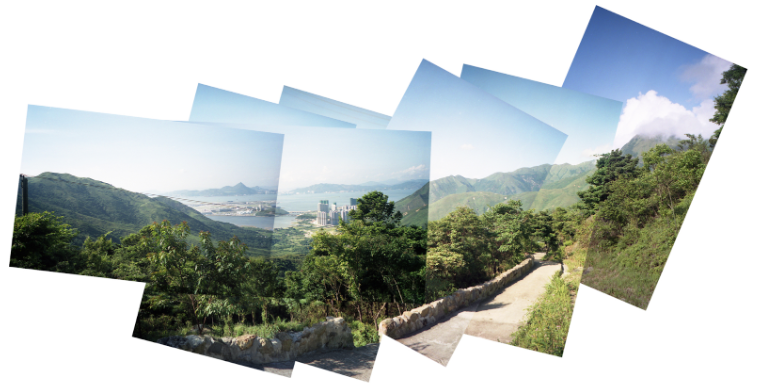

1. Нафотать какую-нибудь сцену с большим перекрытием между кадрами. (Только надо поворачивать, а не смещать камеру. Иначе эффект параллакса даст о себе знать)
2. Сматчить фото между собой. Визуализировать матчи на картинках и проверять фото на адекватность их матчей между собой. 
3. Затем нужно посчитать homography и склеить фото между собой.
4. https://github.com/ndvinh98/Panorama/blob/master/stitch.py

```python
(matches, H, status) = M
		result = cv2.warpPerspective(imageA, H,
			(imageA.shape[1] + imageB.shape[1], imageA.shape[0]))
		result[0:imageB.shape[0], 0:imageB.shape[1]] = imageB
```
Главная идея вот в этих строчках ниже. Посчитать homography между двумя картинками, а потом просто наложить их друг на друга. 

```python
(H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,
				reprojThresh)
```

4. * Задача со звёздочкой. Заменить SIFT-овые ключевые точки на [SuperPoint](https://github.com/rpautrat/SuperPoint) или [SiLK](https://github.com/facebookresearch/silk). Нужно поменять только код вычисления ключевых точек.


In [ ]:
# # Зависимости
# ! pip install opencv-python
# ! pip install scikit-image
# ! pip install matplotlib
# ! pip install scipy

# Загрузка библиотек

In [2]:
from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import logging
import skimage.io as io

# Зависимости задачи со звёздочкой
# import torch
# from common import get_model, load_images, SILK_MATCHER
# from silk.backbones.silk.silk import from_feature_coords_to_image_coords
# from silk.cli.image_pair_visualization import create_img_pair_visual, save_image


# Чтение данных

In [3]:
images_paths = list(Path('./hw_imgs').glob('./photo_*'))
# images_paths = list(Path('./imgs').glob('./image_*'))
images_paths = sorted(images_paths)
image_list = []
for image_path in images_paths:
    image = cv2.imread(image_path.as_posix())
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_list.append(image)

num_images = len(image_list)
print(num_images)

10


# Отобразить изображения

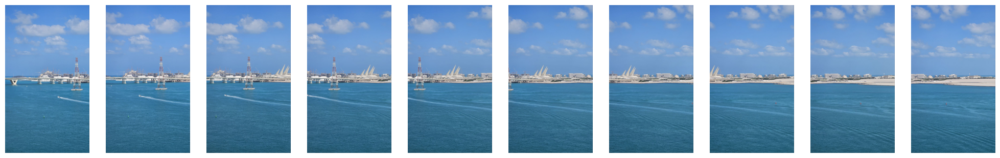

In [4]:
f, axarr = plt.subplots(1,num_images, figsize=(25,20))
for i in range(len(image_list)) :
    axarr[i].imshow(image_list[i])
    axarr[i].axis("off")
plt.show()

### Функции для :
1. evaluate_descriptor_for_image - извлечение ключевых точек и дескрипторов методом SIFT
2. match_keypoints - для сопоставления ключевых точек двух изображений, согласно ближайшим дескрипторам, используя метод k - ближайших соседей
3. draw_matches - для отрисовки сопоставленных ключевых точек в целях отладки

## Панорама с ключевыми точками из SIFT (40 балов)

In [5]:
def evaluate_descriptor_for_image(image : np.array, scale_factor: int = 1):
    # Создаем объект SIFT (Scale-Invariant Feature Transform) 
    # для обнаружения ключевых точек и вычисления дескрипторов
    SIFT = cv2.SIFT_create()

    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape

    # Если задан масштабный коэффициент, изменяем размер изображения
    if scale_factor != 1 :
        image = cv2.resize(image, (orig_w // scale_factor, orig_h // scale_factor))

    # Преобразуем изображение в оттенки серого, так как SIFT работает с монохромными изображениями
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Обнаруживаем ключевые точки и вычисляем дескрипторы с помощью SIFT
    keypoints, descriptors = SIFT.detectAndCompute(image, None)

    # Сохраняем исходные ключевые точки для последующего рисования
    keypoints_orig = keypoints

    # Преобразуем ключевые точки в массив numpy для удобства дальнейших вычислений
    keypoints = np.asarray([[*kp.pt] for kp in keypoints], dtype=np.int32)

    # Масштабируем ключевые точки обратно в исходные размеры изображения
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // scale_factor)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // scale_factor)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки и дескрипторы
    return keypoints_orig, keypoints, descriptors
    
def match_keypoints(kpsA, kpsB, featuresA, featuresB, ratio=0.75, reprojThresh=5.0):
    # Создаем объект FlannBasedMatcher для поиска ближайших соседей между дескрипторами двух изображений
    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))

    # Выполняем сопоставление с использованием k-NN (2 ближайших соседа для каждого дескриптора)
    matches = flann.knnMatch(featuresA, featuresB, k=2)

    # Инициализируем список для хранения "хороших" совпадений
    good = []

    # Проходим по каждому набору пар ближайших соседей (m - лучший матч, n - второй лучший)
    for i, (m, n) in enumerate(matches):
        # Если расстояние до ближайшего соседа значительно меньше, чем до второго (по критерию Лоу),
        # то добавляем этот матч в список хороших
        if m.distance < 0.5 * n.distance:
            good.append(m)

    # Преобразуем "хорошие" матчи в массив индексов (индексы соответствующих ключевых точек на изображениях A и B)
    matches = np.asarray([[m.trainIdx, m.queryIdx] for m in good], dtype=np.int32)

    # Если найдено хотя бы 4 совпадения, можно вычислить гомографию
    if len(matches) > 4:
        # Извлекаем координаты точек на двух изображениях, соответствующих матчам
        ptsA = np.float32([kpsA[i] for (_, i) in matches])
        ptsB = np.float32([kpsB[i] for (i, _) in matches])

        # Вычисляем матрицу гомографии с использованием алгоритма RANSAC
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, reprojThresh)

        # Возвращаем матчи, матрицу гомографии и статус каждой точки (успешное или неуспешное совпадение)
        return (matches, H, status)

    # Если недостаточно совпадений для вычисления гомографии, возвращаем None
    return None

def draw_matches(imageA, imageB, kpsA, kpsB, matches, status):
    # Извлекаем размеры двух изображений
    (hA, wA) = imageA.shape[:2]
    (hB, wB) = imageB.shape[:2]

    # Создаем пустое изображение для визуализации, которое объединяет два изображения по горизонтали
    vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")

    # Копируем изображение A в левую часть визуализации
    vis[0:hA, 0:wA] = imageA

    # Копируем изображение B в правую часть визуализации
    vis[0:hB, wA:] = imageB

    # Проходим по каждому совпадению и статусу (если статус равен 1, совпадение считается успешным)
    for ((trainIdx, queryIdx), s) in zip(matches, status):
        # Обрабатываем совпадение, если оно было успешно
        if s == 1:
            # Извлекаем координаты ключевых точек на изображении A
            ptA = (int(kpsA[queryIdx][0]), int(kpsA[queryIdx][1]))

            # Извлекаем координаты ключевых точек на изображении B, сдвинутые на ширину изображения A
            ptB = (int(kpsB[trainIdx][0]) + wA, int(kpsB[trainIdx][1]))

            # Рисуем линию, соединяющую соответствующие точки на двух изображениях
            cv2.line(vis, ptA, ptB, (0, 255, 0), 1)

    # Возвращаем изображение с визуализированными совпадениями
    return vis

### Опишем функции для устранения перекрытий и сглаживания границ

blending_mask - вычисляет маски для плавного перехода одного изображения в другое
panorama_blending - смешивает два изображения с заданными параметрами

*TODO: Реализовать в функции panorama_blending смешивание изображений с заданными масками*

In [6]:
def blending_mask(height, width, barrier, smoothing_window, left_biased=True):
    # Убеждаемся, что граница (barrier) меньше ширины изображения
    assert barrier < width
    # Инициализируем маску нулями размером height x width
    mask = np.zeros((height, width))

    # Рассчитываем смещение как половину окна сглаживания
    offset = int(smoothing_window / 2)
    try:
        # Если изображение слева имеет приоритет
        if left_biased:
            # Заполняем маску переходом от 1 к 0 в окне сглаживания вдоль границы
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(1, 0, 2 * offset + 1).T, (height, 1)
            )
            # Остальную часть левой стороны маски заполняем единицами
            mask[:, : barrier - offset] = 1
        else:
            # Если изображение справа имеет приоритет, аналогичный переход от 0 к 1
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(0, 1, 2 * offset + 1).T, (height, 1)
            )
            # Остальная часть правой стороны маски заполняется единицами
            mask[:, barrier + offset :] = 1
    except BaseException:
        # В случае ошибки сокращаем длину окна перехода на 1
        if left_biased:
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(1, 0, 2 * offset).T, (height, 1)
            )
            mask[:, : barrier - offset] = 1
        else:
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(0, 1, 2 * offset).T, (height, 1)
            )
            mask[:, barrier + offset :] = 1

    # Возвращаем маску в виде трехканального изображения для удобного наложения на цветные изображения
    return cv2.merge([mask, mask, mask])

def panorama_blending(dst_img_rz, src_img_warped, width_dst, side):
    """Эта функция создает плавный переход между двумя изображениями @dst_img_rz и @src_img_warped.
    @width_dst указывает, где находится граница между изображениями,
    а @smoothing_window определяет ширину сглаживания на границе.
    @left_biased управляет направлением сглаживания.
    """

    # Получаем высоту и ширину результирующего изображения
    h, w, _ = dst_img_rz.shape
    # Задаем ширину сглаживания как восьмую часть ширины исходного изображения
    smoothing_window = int(width_dst / 8)
    # Определяем положение границы с учетом сглаживания
    barrier = width_dst - int(smoothing_window / 2)
    # Создаем маски для левого и правого изображения
    mask1 = blending_mask(
        h, w, barrier, smoothing_window=smoothing_window, left_biased=True
    )
    mask2 = blending_mask(
        h, w, barrier, smoothing_window=smoothing_window, left_biased=False
    )

    # Если левое изображение имеет приоритет, делаем зеркальный переход
    if side == "left":
        dst_img_rz = cv2.flip(dst_img_rz, 1)
        src_img_warped = cv2.flip(src_img_warped, 1)
        # Накладываем маски на изображения
        dst_img_rz = dst_img_rz * mask1
        src_img_warped = src_img_warped * mask2
        # Суммируем изображения для плавного перехода
        pano = src_img_warped + dst_img_rz
        # Возвращаем изображение в нормальное положение
        pano = cv2.flip(pano, 1)

    else:
        # Если приоритет у правого изображения, то накладываем маски без зеркального перехода
        dst_img_rz = dst_img_rz * mask1
        src_img_warped = src_img_warped * mask2
        pano = src_img_warped + dst_img_rz

    return pano


### Опишем функции для нахождения и применения гомографии относительного правого изображения c учетом ключевых точек из метода SIFT

In [7]:
def crop(panorama, h_dst, conners):
    """Обрезает панораму на основе целевого изображения.
    @param panorama — итоговая панорама
    @param h_dst — высота целевого изображения
    @param conners — кортеж, содержащий четыре угловые точки искаженного изображения и
    четыре угловые точки целевого изображения."""
    
    # Находим минимальные значения по координатам x и y среди углов
    [xmin, ymin] = np.int32(conners.min(axis=0).ravel() - 0.5)
    # Смещение для выравнивания изображений
    t = [-xmin, -ymin]
    # Приводим координаты углов к целым числам
    conners = conners.astype(int)

    # Если X-координата верхнего левого угла искаженного изображения < 0,
    # значит, искаженное изображение присоединяется слева от целевого
    if conners[0][0][0] < 0:
        # Определяем ширину обрезки для левой стороны
        n = abs(-conners[1][0][0] + conners[0][0][0])
        # Обрезаем панораму справа
        panorama = panorama[t[1] : h_dst + t[1], n:, :]
    else:
        # Если X-координата нижнего правого угла меньше верхнего правого,
        # то обрезаем панораму слева
        if conners[2][0][0] < conners[3][0][0]:
            panorama = panorama[t[1] : h_dst + t[1], 0 : conners[2][0][0], :]
        else:
            # Иначе обрезаем панораму справа
            panorama = panorama[t[1] : h_dst + t[1], 0 : conners[3][0][0], :]
    return panorama



def warp_two_images(src_img, dst_img):
    # Вычисляем ключевые точки и дескрипторы для исходного изображения (src_img)
    _, keypoints_src, descriptors_src = evaluate_descriptor_for_image(src_img)
    # Вычисляем ключевые точки и дескрипторы для целевого изображения (dst_img)
    _, keypoints_dst, descriptors_dst = evaluate_descriptor_for_image(dst_img)

    # Находим матрицу гомографии (H) и совпадающие ключевые точки между изображениями
    (matches, H, _) = match_keypoints(keypoints_src, 
                                    keypoints_dst,                                
                                    descriptors_src, 
                                    descriptors_dst, 
                                    True)

    # Получаем размеры изображений
    height_src, width_src = src_img.shape[:2]
    height_dst, width_dst = dst_img.shape[:2]

    # Извлекаем углы изображений: верхний левый, нижний левый, нижний правый, верхний правый
    pts1 = np.float32(
        [[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]
    ).reshape(-1, 1, 2)
    pts2 = np.float32(
        [[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]
    ).reshape(-1, 1, 2)

    try:
        # Применяем матрицу гомографии к углам src_img
        pts1_ = cv2.perspectiveTransform(pts1, H)
        # Объединяем углы обоих изображений
        pts = np.concatenate((pts1_, pts2), axis=0)

        # Находим минимальные и максимальные координаты x и y
        [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
        [_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
        # Смещение для выравнивания
        t = [-xmin, -ymin]

        # Определяем, слева или справа будет прикреплено искаженное изображение
        if pts[0][0][0] < 0:
            side = "left"
            width_pano = width_dst + t[0]
        else:
            width_pano = int(pts1_[3][0][0])
            side = "right"
        height_pano = ymax - ymin

        # Создаем матрицу смещения
        Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
        # Применяем смещение к исходному изображению
        src_img_warped = cv2.warpPerspective(
            src_img, Ht.dot(H), (width_pano, height_pano)
        )
        
        # Создаем пустое изображение, имеющее тот же размер, что и искаженное изображение
        dst_img_rz = np.zeros((height_pano, width_pano, 3))
        
        # Размещаем целевое изображение на нужной стороне
        if side == "left":
            dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
        else:
            dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

        # Плавное объединение изображений
        pano = panorama_blending(dst_img_rz, src_img_warped, width_dst, side)

        # Обрезка черной области на краях
        pano = crop(pano, height_dst, pts)
        return pano
    
    except BaseException:
        # В случае ошибки выводим сообщение
        raise Exception("Please try again with another image set!")


### Отобразим ключевые точки метода SIFT

In [8]:
kp_orig_list = []
keypoints_list = []
descriptors_list = []
for image in image_list :
    kp_orig, keypoints, descriptors = evaluate_descriptor_for_image(image)
    kp_orig_list.append(kp_orig)
    keypoints_list.append(keypoints)
    descriptors_list.append(descriptors)
    print('kp_orig length: ', len(kp_orig), ',' 
          'keypoints shape: ', keypoints.shape, ',' 
          'descriptors shape: ', descriptors.shape,)
    print('--------------------------')
keypoints[:10, :]

kp_orig length:  1118 ,keypoints shape:  (1118, 2) ,descriptors shape:  (1118, 128)
--------------------------
kp_orig length:  1272 ,keypoints shape:  (1272, 2) ,descriptors shape:  (1272, 128)
--------------------------
kp_orig length:  1408 ,keypoints shape:  (1408, 2) ,descriptors shape:  (1408, 128)
--------------------------
kp_orig length:  1437 ,keypoints shape:  (1437, 2) ,descriptors shape:  (1437, 128)
--------------------------
kp_orig length:  1383 ,keypoints shape:  (1383, 2) ,descriptors shape:  (1383, 128)
--------------------------
kp_orig length:  1228 ,keypoints shape:  (1228, 2) ,descriptors shape:  (1228, 128)
--------------------------
kp_orig length:  1071 ,keypoints shape:  (1071, 2) ,descriptors shape:  (1071, 128)
--------------------------
kp_orig length:  968 ,keypoints shape:  (968, 2) ,descriptors shape:  (968, 128)
--------------------------
kp_orig length:  1034 ,keypoints shape:  (1034, 2) ,descriptors shape:  (1034, 128)
--------------------------
kp_o

array([[   2, 1075],
       [   3, 1264],
       [   6, 1110],
       [   6,  663],
       [   6,  668],
       [   8,  640],
       [   8, 1247],
       [   8, 1247],
       [   9,  650],
       [   9,  666]])

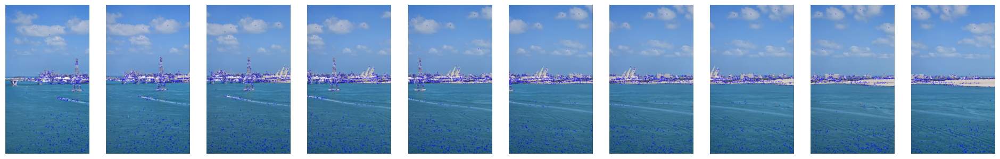

In [9]:
f, axarr = plt.subplots(1, 10, figsize=(24,70))
for i, image in enumerate(image_list):
    output_image = cv2.drawKeypoints(image, 
                                     kp_orig_list[i], 
                                     0, 
                                     (0, 0, 255),
                                     flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
    axarr[i].imshow(output_image)
    axarr[i].axis('off')
plt.show()

По хорошему, надо выкинуть ключевые точки, которые находятся на воде. Слишком динамическая природа что может привезти к проблемам с гомографией

### Сопоставим ближайшие по дескрипторам ключевые точки

In [10]:
print(keypoints_list[0].shape)
(matches, H, status) = match_keypoints(keypoints_list[0],                             
                                       keypoints_list[1],                        
                                       descriptors_list[0],                             
                                       descriptors_list[1]                            
                                       )

(1118, 2)


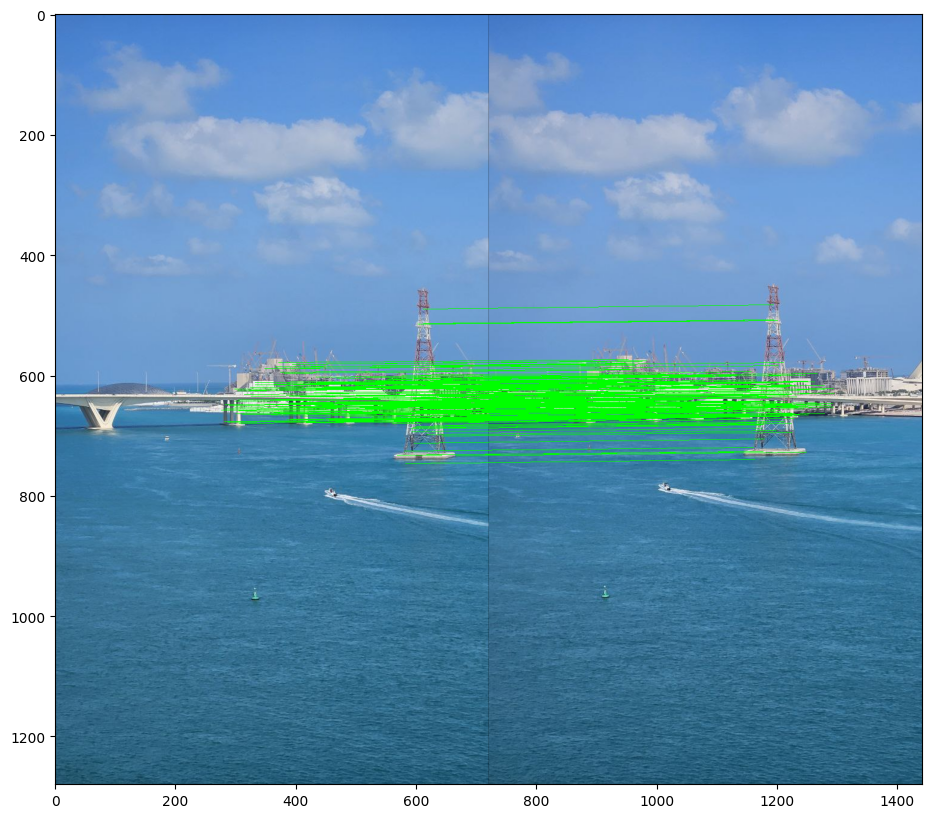

In [11]:
plt.figure(figsize=(20,10))
plt.imshow(draw_matches(image_list[0], 
                        image_list[1], 
                        keypoints_list[0], 
                        keypoints_list[1], 
                        matches, 
                        status))
plt.show()

Точки на водной поверхности сами исключились во время матчинга

### Посчитаем панораму для двух изображений, используя ключевые точки из SIFT

In [12]:
pano = warp_two_images(image_list[0], image_list[1])

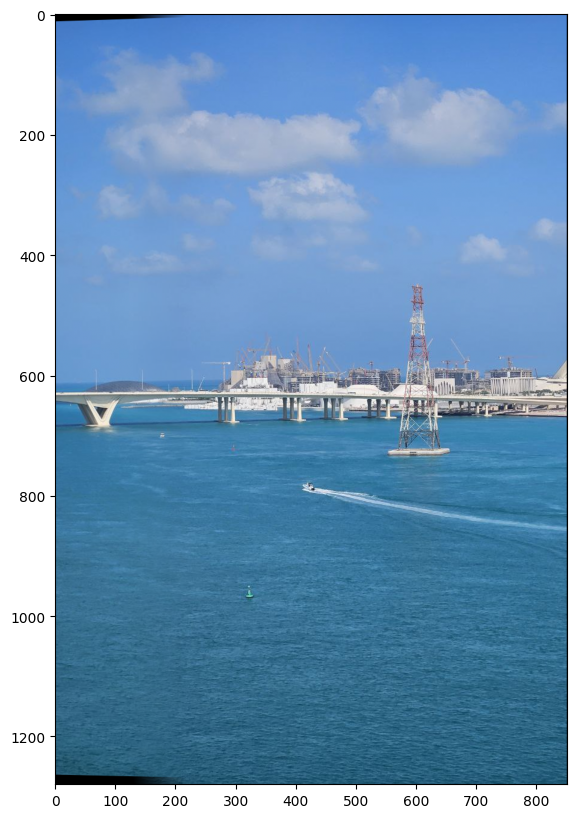

In [13]:
plt.figure(figsize=(10,10))
pano_normal = np.array(pano, dtype=float)/float(255)
plt.imshow(pano_normal)
plt.show()

### Напишем функцию для составления панорамы из множества изображений

In [14]:
def multi_stitching(list_images):
    """Принимает список изображений, объединяет их в панораму, начиная с центрального изображения.
    list_images - список изображений, расположенных слева направо. Предполагается, что
    изображения расположены слева направо, функция сначала выбирает центральное изображение
    и делит список на две подгруппы: левую и правую."""

    # Определяем индекс центрального изображения
    n = int(len(list_images) / 2 + 0.5)
    
    # Разделяем список изображений на две части: левую и правую
    left = list_images[:n]        # изображения слева от центрального
    right = list_images[n - 1 :]   # изображения справа от центрального
    
    # Разворачиваем правый список для более удобного объединения
    right.reverse()

    # Объединяем изображения в левой подгруппе, пока не останется одно изображение
    while len(left) > 1:
        # Извлекаем два изображения для сшивания
        dst_img = left.pop()
        src_img = left.pop()
        # Сшиваем изображения с помощью warp_two_images
        left_pano = warp_two_images(src_img, dst_img)
        left_pano = left_pano.astype("uint8")  # Преобразуем в целочисленный тип данных
        left.append(left_pano)  # Добавляем результат в левую подгруппу

    # Объединяем изображения в правой подгруппе, пока не останется одно изображение
    while len(right) > 1:
        dst_img = right.pop()
        src_img = right.pop()
        # Сшиваем изображения
        right_pano = warp_two_images(src_img, dst_img)
        right_pano = right_pano.astype("uint8")  # Преобразуем в целочисленный тип данных
        right.append(right_pano)  # Добавляем результат в правую подгруппу

    # Сравниваем ширину панорам правой и левой подгрупп и выбираем наиболее широкую в качестве конечного назначения
    if right_pano.shape[1] >= left_pano.shape[1]:
        # Если панорама правой подгруппы шире, сшиваем её с левой панорамой
        fullpano = warp_two_images(left_pano, right_pano)
    else:
        # Если панорама левой подгруппы шире, сшиваем её с правой панорамой
        fullpano = warp_two_images(right_pano, left_pano)
    
    # Возвращаем итоговую панораму
    return fullpano


### Построим панораму, используя ключевые точки из SIFT

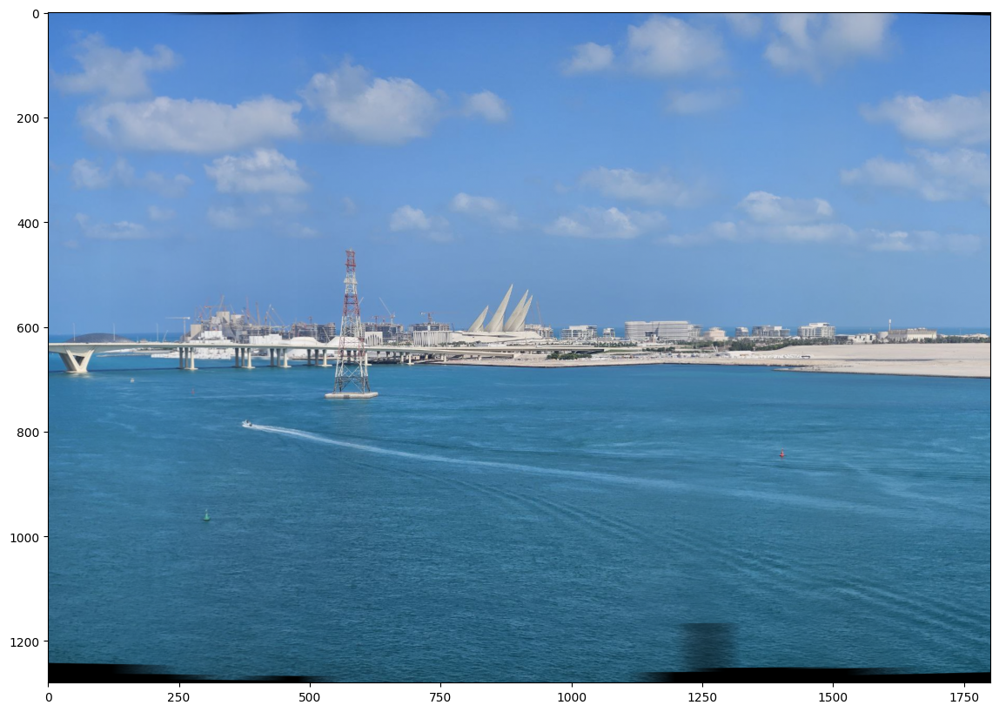

In [16]:
full_panorama = multi_stitching(image_list.copy())
full_panorama_normal = np.array(full_panorama, dtype=float)/float(255)
plt.figure(figsize=(15,10))
plt.imshow(full_panorama_normal)
plt.show()

Чистка изображения от артефактов сшивания

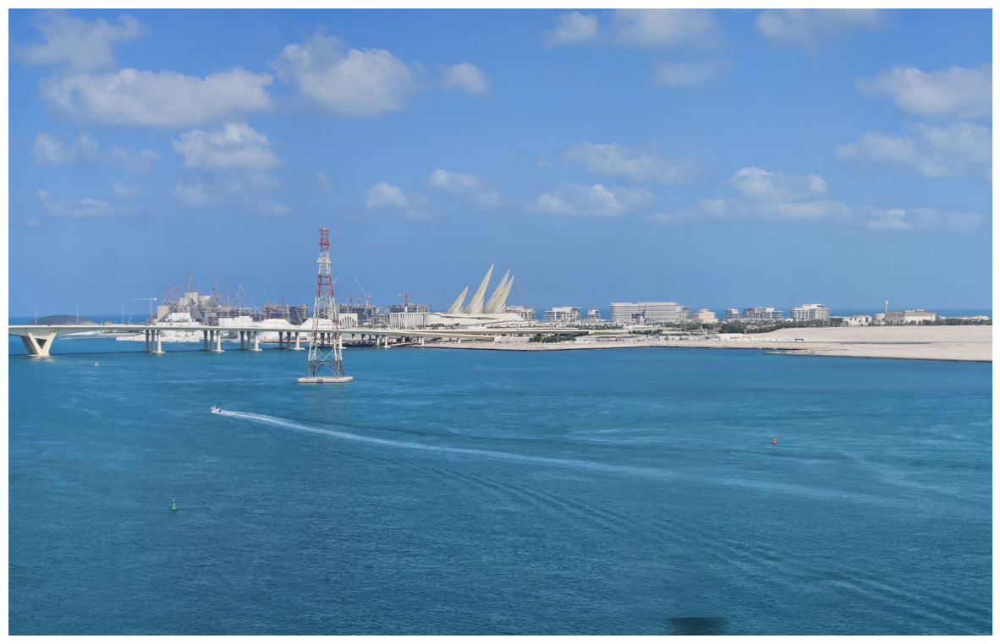

In [17]:
full_panorama_normal = full_panorama_normal[50:1200, :, :]
plt.figure(figsize=(15,10))
plt.axis("off")
plt.imshow(full_panorama_normal)

## Панорама с ключевыми точками из Silk (10 балов)

## Загрузка библиотек для работы с SuperPoint

In [18]:
from transformers import AutoImageProcessor, SuperPointForKeypointDetection
import torch
from PIL import Image
import requests

## Чтение изображений

In [23]:
images_paths = list(Path('./hw_imgs').glob('./photo_*'))
# images_paths = list(Path('./imgs').glob('./image_*'))
images_paths = sorted(images_paths)
image_list = []
for image_path in images_paths:
    image = cv2.imread(image_path.as_posix())
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_list.append(image)

num_images = len(image_list)

## Загрузка модели и процессора для подготовки изображения

In [20]:
device = "cuda" if torch.cuda.is_available() else "cpu"
processor = AutoImageProcessor.from_pretrained("magic-leap-community/superpoint")
model = SuperPointForKeypointDetection.from_pretrained("magic-leap-community/superpoint").to(device)

### Тестовый блок

In [21]:
image = image_list[0]

image_sizes = [image.shape[:2]]
print(image_sizes)

image = cv2.resize(image, dsize=(640, 480))

inputs = processor(image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)


kpts = outputs.keypoints.cpu().numpy()[0]
sc = outputs.scores.cpu().numpy()[0]

[(1280, 721)]


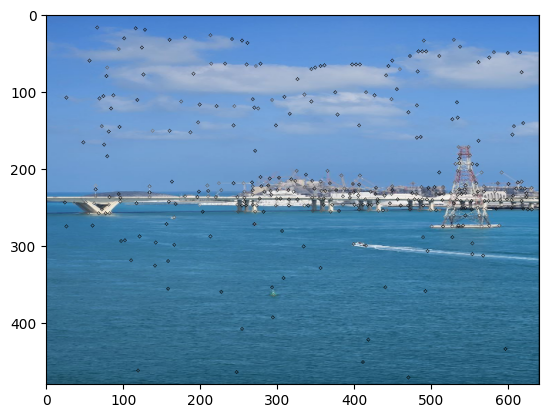

In [22]:
plt.figure()
for kp, score in zip(kpts, sc):
    keypoint_x, keypoint_y = int(kp[0].item()), int(kp[1].item())
    color = tuple([score.item() * 255] * 3)
    image = cv2.circle(image, (keypoint_x, keypoint_y), 2, color)
plt.imshow(image)

## Обновлённые методы для работы с SuperPoint

In [25]:
def evaluate_descriptor_for_image_superpoint(image: np.array, scale_factor: int = 1):
    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape

    # Если указан масштабный коэффициент, изменяем размер изображения
    if scale_factor != 1:
        image = cv2.resize(image, (orig_w // scale_factor, orig_h // scale_factor))

    # Изменяем размер изображения до 640x480 для соответствия входным требованиям модели
    image = cv2.resize(image, dsize=(640, 480))

    # Подготавливаем изображение для модели, используя процессор (например, трансформеры для PyTorch)
    inputs = processor(image, return_tensors="pt").to(device)

    # Прогоняем изображение через модель, получая выходные данные
    outputs = model(**inputs)

    # Извлекаем ключевые точки, дескрипторы и метрики вероятности из выходных данных
    keypoints, descriptors, scores = outputs.keypoints, outputs.descriptors, outputs.scores

    # Сохраняем изначальные ключевые точки для возможного дальнейшего использования (например, визуализации)
    keypoints_orig = keypoints

    # Масштабируем ключевые точки обратно к исходным размерам изображения, чтобы учесть масштабирование
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // scale_factor)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // scale_factor)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки, дескрипторы и вероятности
    return keypoints_orig.cpu().numpy()[0], keypoints.cpu().numpy()[0], descriptors.cpu().detach().numpy()[0], scores.cpu().detach().numpy()[0]


In [27]:
def warp_two_images_superpoint(src_img, dst_img):
    # Вычисляем ключевые точки и дескрипторы для исходного изображения (src_img)
    _, keypoints_src, descriptors_src, _ = evaluate_descriptor_for_image_superpoint(src_img)
    # Вычисляем ключевые точки и дескрипторы для целевого изображения (dst_img)
    _, keypoints_dst, descriptors_dst, _ = evaluate_descriptor_for_image_superpoint(dst_img)

    # Находим матрицу гомографии (H) и совпадающие ключевые точки между двумя изображениями
    (matches, H, _) = match_keypoints(keypoints_src, 
                                    keypoints_dst,                                
                                    descriptors_src, 
                                    descriptors_dst, 
                                    True)
    
    # Изменяем размер изображений src_img и dst_img до 640x480
    src_img = cv2.resize(src_img, dsize=(640,480))
    dst_img = cv2.resize(dst_img, dsize=(640,480))

    # Получаем высоту и ширину обоих изображений
    height_src, width_src = src_img.shape[:2]
    height_dst, width_dst = dst_img.shape[:2]

    # Задаем координаты углов обоих изображений: верхний левый, нижний левый, нижний правый, верхний правый
    pts1 = np.float32(
        [[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]
    ).reshape(-1, 1, 2)
    pts2 = np.float32(
        [[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]
    ).reshape(-1, 1, 2)

    try:
        # Применяем гомографию к углам src_img
        pts1_ = cv2.perspectiveTransform(pts1, H)
        # Объединяем координаты углов src_img и dst_img
        pts = np.concatenate((pts1_, pts2), axis=0)

        # Находим минимальные и максимальные значения x и y среди объединенных углов
        [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
        # Определяем смещение для последующего выравнивания
        t = [-xmin, -ymin]

        # Определяем, с какой стороны src_img будет совмещено с dst_img
        # Если x-координата левого верхнего угла src_img после преобразования меньше 0, оно будет слева
        if pts[0][0][0] < 0:
            side = "left"
            width_pano = width_dst + t[0]
        else:
            width_pano = int(xmax)
            side = "right"
        # Определяем высоту панорамы
        height_pano = ymax - ymin

        # Применяем смещение
        Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
        # Трансформируем src_img, чтобы совместить его с dst_img по параметрам гомографии
        src_img_warped = cv2.warpPerspective(src_img, Ht.dot(H), (width_pano, height_pano))
        
        # Создаем пустой массив dst_img_rz для изменения размера, чтобы оно соответствовало src_img_warped
        dst_img_rz = np.zeros((height_pano, width_pano, 3))
        
        # Вставляем dst_img на панораму в зависимости от стороны
        if side == "left":
            dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
        else:
            dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

        # Выполняем слияние изображений для панорамы
        pano = panorama_blending(dst_img_rz, src_img_warped, width_dst, side)

        # Обрезаем черные области, чтобы улучшить финальную панораму
        pano = crop(pano, height_dst, pts)
        return pano
    
    except BaseException:
        # В случае ошибки выдает сообщение с рекомендацией попробовать другой набор изображений
        raise Exception("Please try again with another image set!")


In [28]:
def multi_stitching_superpoint(list_images):
    n = int(len(list_images) / 2 + 0.5) # +0.5
    left = list_images[:n]
    right = list_images[n-1:]
    right.reverse()
    while len(left) > 1:
        dst_img = left.pop()
        src_img = left.pop()
        left_pano = warp_two_images_superpoint(src_img, dst_img)
        left_pano = left_pano.astype("uint8")
        left.append(left_pano)

    while len(right) > 1:
        dst_img = right.pop()
        src_img = right.pop()
        right_pano = warp_two_images_superpoint(src_img, dst_img)
        right_pano = right_pano.astype("uint8")
        right.append(right_pano)

    # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
    if right_pano.shape[1] >= left_pano.shape[1]:
        fullpano = warp_two_images_superpoint(left_pano, right_pano)
    else:
        fullpano = warp_two_images_superpoint(right_pano, left_pano)
    return fullpano

In [29]:
def draw_matches_superpoint(imageA, imageB, kpsA, kpsB, matches, status):

    imageA = cv2.resize(imageA, dsize=(640,480))
    imageB = cv2.resize(imageB, dsize=(640,480))
    
    # Извлекаем размеры двух изображений
    (hA, wA) = imageA.shape[:2]
    (hB, wB) = imageB.shape[:2]

    print(imageA.shape, imageB.shape)

    # Создаем пустое изображение для визуализации, которое объединяет два изображения по горизонтали
    vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")

    # Копируем изображение A в левую часть визуализации
    vis[0:hA, 0:wA] = imageA

    # Копируем изображение B в правую часть визуализации
    vis[0:hB, wA:] = imageB

    # Проходим по каждому совпадению и статусу (если статус равен 1, совпадение считается успешным)
    for ((indA, indB), s) in zip(matches, status):
        # Обрабатываем совпадение, если оно было успешно
        if s == 1:
            # Извлекаем координаты ключевых точек на изображении A
            ptA = (int(kpsA[indB][0]), int(kpsA[indB][1]))

            # Извлекаем координаты ключевых точек на изображении B, сдвинутые на ширину изображения A
            ptB = (int(kpsB[indA][0]) + wA, int(kpsB[indA][1]))

            # Рисуем линию, соединяющую соответствующие точки на двух изображениях
            cv2.line(vis, ptA, ptB, (0, 255, 0), 1)

    # Возвращаем изображение с визуализированными совпадениями
    return vis

## Поиск ключевых точек и отображение их на изображении

In [30]:
kp_orig_list = []
keypoints_list = []
descriptors_list = []
scores_list = []
for image in image_list :
    kp_orig, keypoints, descriptors, scores = evaluate_descriptor_for_image_superpoint(image)
    kp_orig_list.append(kp_orig)
    keypoints_list.append(keypoints)
    descriptors_list.append(descriptors)
    scores_list.append(scores)
    print('kp_orig length: ', len(kp_orig), ',' 
          'keypoints shape: ', keypoints.shape, ',' 
          'descriptors shape: ', descriptors.shape,
          'scores shape: ', scores.shape,)
    print('--------------------------')

kp_orig length:  378 ,keypoints shape:  (378, 2) ,descriptors shape:  (378, 256) scores shape:  (378,)
--------------------------
kp_orig length:  374 ,keypoints shape:  (374, 2) ,descriptors shape:  (374, 256) scores shape:  (374,)
--------------------------
kp_orig length:  379 ,keypoints shape:  (379, 2) ,descriptors shape:  (379, 256) scores shape:  (379,)
--------------------------
kp_orig length:  338 ,keypoints shape:  (338, 2) ,descriptors shape:  (338, 256) scores shape:  (338,)
--------------------------
kp_orig length:  315 ,keypoints shape:  (315, 2) ,descriptors shape:  (315, 256) scores shape:  (315,)
--------------------------
kp_orig length:  252 ,keypoints shape:  (252, 2) ,descriptors shape:  (252, 256) scores shape:  (252,)
--------------------------
kp_orig length:  237 ,keypoints shape:  (237, 2) ,descriptors shape:  (237, 256) scores shape:  (237,)
--------------------------
kp_orig length:  234 ,keypoints shape:  (234, 2) ,descriptors shape:  (234, 256) scores sh

<Figure size 640x480 with 0 Axes>

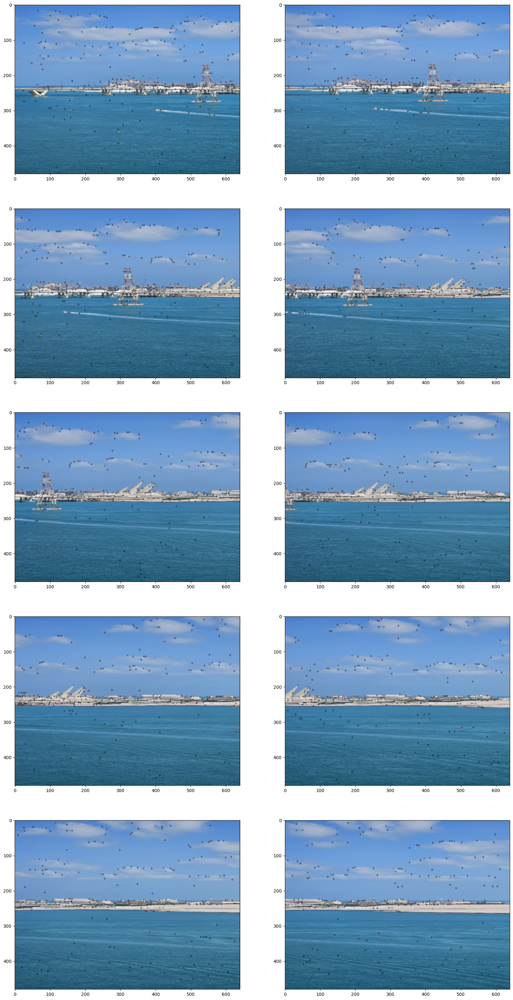

In [31]:
plt.figure()
fig, ax = plt.subplots(5,2,figsize=(20, 40))
for i, image in enumerate(image_list):

    image = cv2.resize(image, dsize=(640,480))
    kpts = keypoints_list[i]
    score = scores_list[i]

    for kp, sc in zip(kpts, score):
        keypoint_x, keypoint_y = int(kp[0]), int(kp[1])
        color = tuple([sc * 255] * 3)
        image = cv2.circle(image, (keypoint_x, keypoint_y), 2, color)
    
    ax[i//2, i%2].imshow(image)

plt.imshow(image)

## Поиск одиннаковых ключевых точек на изображении

In [36]:
(matches, H, status) = match_keypoints(keypoints_list[0],                             
                                       keypoints_list[1],                        
                                       descriptors_list[0],                             
                                       descriptors_list[1]                            
                                       )

(480, 640, 3) (480, 640, 3)


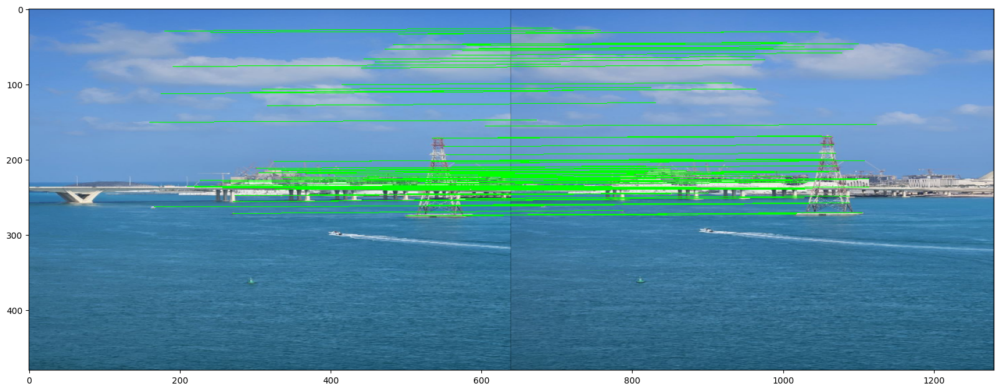

In [37]:
plt.figure(figsize=(20,20))
plt.imshow(draw_matches_superpoint(image_list[0], 
                        image_list[1], 
                        keypoints_list[0], 
                        keypoints_list[1], 
                        matches, 
                        status))
plt.show()

Тестовая сшивка панорамы для двух изображений

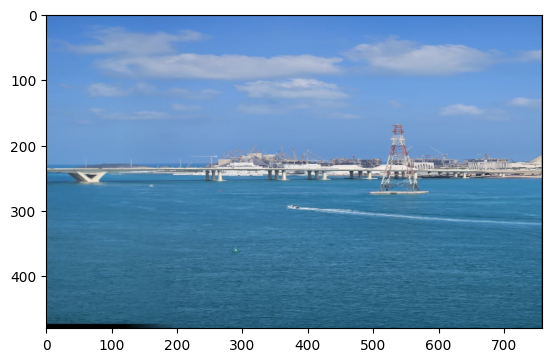

In [38]:
pano = warp_two_images_superpoint(image_list[0], image_list[1])
plt.imshow(pano.astype(np.uint8))

## Создание панорамы

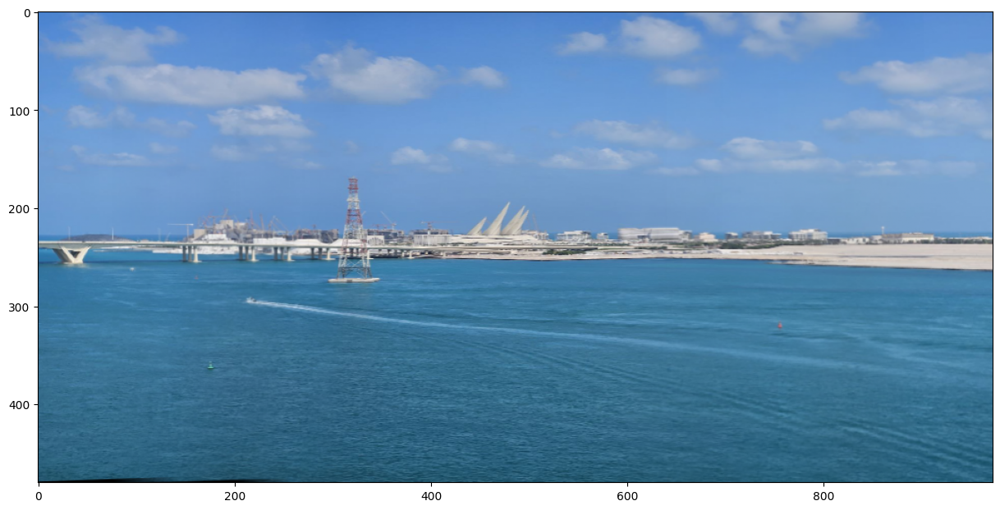

In [39]:
full_panorama = multi_stitching_superpoint(image_list.copy())
full_panorama_normal = np.array(full_panorama, dtype=float)/float(255)
plt.figure(figsize=(15,10))
plt.imshow(full_panorama_normal)
plt.show()


Вариант когда происходит масштабирование координат ключевых точек

In [40]:
def warp_two_images_superpoint_v2(src_img, dst_img):
    # Вычисляем ключевые точки и дескрипторы для исходного изображения (src_img)
    _, keypoints_src, descriptors_src, _ = evaluate_descriptor_for_image_superpoint_v2(src_img)
    # Вычисляем ключевые точки и дескрипторы для целевого изображения (dst_img)
    _, keypoints_dst, descriptors_dst, _ = evaluate_descriptor_for_image_superpoint_v2(dst_img)

    # Находим матрицу гомографии (H) и совпадающие ключевые точки между двумя изображениями
    (matches, H, _) = match_keypoints(keypoints_src, 
                                    keypoints_dst,                                
                                    descriptors_src, 
                                    descriptors_dst, 
                                    True)
    
    # src_img = cv2.resize(src_img, dsize=(640,480))
    # dst_img = cv2.resize(dst_img, dsize=(640,480))

    # get height and width of two images
    height_src, width_src = src_img.shape[:2]
    height_dst, width_dst = dst_img.shape[:2]

    # extract conners of two images: top-left, bottom-left, bottom-right, top-right
    pts1 = np.float32(
        [[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]
    ).reshape(-1, 1, 2)
    pts2 = np.float32(
        [[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]
    ).reshape(-1, 1, 2)

    try:
        # aply homography to conners of src_img
        pts1_ = cv2.perspectiveTransform(pts1, H)
        pts = np.concatenate((pts1_, pts2), axis=0)

        # find max min of x,y coordinate
        [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
        t = [-xmin, -ymin]

        # top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
        # otherwise side=right
        # source image is merged to the left side or right side of destination image
        if pts[0][0][0] < 0:
            side = "left"
            width_pano = width_dst + t[0]
        else:
            width_pano = int(xmax)
            # width_pano = int(pts1_[3][0][0])
            side = "right"
        height_pano = ymax - ymin

        # Translation
        # https://stackoverflow.com/a/20355545
        Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
        src_img_warped = cv2.warpPerspective(src_img, Ht.dot(H), (width_pano, height_pano))
        # generating size of dst_img_rz which has the same size as src_img_warped
        dst_img_rz = np.zeros((height_pano, width_pano, 3))
        if side == "left":
            dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
        else:
            dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

        # blending panorama
        pano = panorama_blending(dst_img_rz, src_img_warped, width_dst, side)

        # croping black region
        pano = crop(pano, height_dst, pts)
        return pano
    
    except BaseException:
        
        raise Exception("Please try again with another image set!")
def evaluate_descriptor_for_image_superpoint_v2(image : np.array, scale_factor = True):


    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape
    # Расширение изображение которое приходит в нейронную сеть 480, 640

    # Если задан масштабный коэффициент, изменяем размер изображения
    if scale_factor:
        w_scale = orig_w / 640
        h_scale = orig_h / 480
        image = cv2.resize(image, (640,  480))

    inputs = processor(image, return_tensors="pt").to(device)

    outputs = model(**inputs)

    # Обнаруживаем ключевые точки и вычисляем дескрипторы с помощью SuperPoint
    keypoints, descriptors, scores = outputs.keypoints, outputs.descriptors, outputs.scores

    # Сохраняем исходные ключевые точки для последующего рисования
    keypoints = keypoints.cpu().numpy()[0]
    keypoints_orig = keypoints

    # Преобразуем ключевые точки в массив numpy для удобства дальнейших вычислений
    # keypoints = np.asarray([[*kp.pt] for kp in keypoints], dtype=np.int32)
    # keypoint_x, keypoint_y = int(keypoint[0].item()), int(keypoint[1].item())
    
    # Масштабируем ключевые точки обратно в исходные размеры изображения
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // w_scale)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // h_scale)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки и дескрипторы
    return keypoints_orig, keypoints, descriptors.detach().cpu().numpy()[0], scores.detach().cpu().numpy()[0]
def multi_stitching_superpoint_v2(list_images):
    n = int(len(list_images) / 2 + 0.5) # +0.5
    left = list_images[:n]
    right = list_images[n-1:]
    right.reverse()
    while len(left) > 1:
        dst_img = left.pop()
        src_img = left.pop()
        left_pano = warp_two_images_superpoint_v2(src_img, dst_img)
        left_pano = left_pano.astype("uint8")
        left.append(left_pano)

    while len(right) > 1:
        dst_img = right.pop()
        src_img = right.pop()
        right_pano = warp_two_images_superpoint_v2(src_img, dst_img)
        right_pano = right_pano.astype("uint8")
        right.append(right_pano)

    # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
    if right_pano.shape[1] >= left_pano.shape[1]:
        fullpano = warp_two_images_superpoint_v2(left_pano, right_pano)
    else:
        fullpano = warp_two_images_superpoint_v2(right_pano, left_pano)
    return fullpano

In [41]:
def evaluate_descriptor_for_image_superpoint_v2(image : np.array, scale_factor = True):


    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape
    # Расширение изображение которое приходит в нейронную сеть 480, 640

    # Если задан масштабный коэффициент, изменяем размер изображения
    if scale_factor:
        w_scale = orig_w / 640
        h_scale = orig_h / 480
        image = cv2.resize(image, (640,  480))

    inputs = processor(image, return_tensors="pt").to(device)

    outputs = model(**inputs)

    # Обнаруживаем ключевые точки и вычисляем дескрипторы с помощью SuperPoint
    keypoints, descriptors, scores = outputs.keypoints, outputs.descriptors, outputs.scores

    # Сохраняем исходные ключевые точки для последующего рисования
    keypoints = keypoints.cpu().numpy()[0]
    keypoints_orig = keypoints

    # Преобразуем ключевые точки в массив numpy для удобства дальнейших вычислений
    # keypoints = np.asarray([[*kp.pt] for kp in keypoints], dtype=np.int32)
    # keypoint_x, keypoint_y = int(keypoint[0].item()), int(keypoint[1].item())
    
    # Масштабируем ключевые точки обратно в исходные размеры изображения
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // w_scale)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // h_scale)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки и дескрипторы
    return keypoints_orig, keypoints, descriptors.detach().cpu().numpy()[0], scores.detach().cpu().numpy()[0]

In [42]:
def multi_stitching_superpoint_v2(list_images):
    n = int(len(list_images) / 2 + 0.5) # +0.5
    left = list_images[:n]
    right = list_images[n-1:]
    right.reverse()
    while len(left) > 1:
        dst_img = left.pop()
        src_img = left.pop()
        left_pano = warp_two_images_superpoint_v2(src_img, dst_img)
        left_pano = left_pano.astype("uint8")
        left.append(left_pano)

    while len(right) > 1:
        dst_img = right.pop()
        src_img = right.pop()
        right_pano = warp_two_images_superpoint_v2(src_img, dst_img)
        right_pano = right_pano.astype("uint8")
        right.append(right_pano)

    # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
    if right_pano.shape[1] >= left_pano.shape[1]:
        fullpano = warp_two_images_superpoint_v2(left_pano, right_pano)
    else:
        fullpano = warp_two_images_superpoint_v2(right_pano, left_pano)
    return fullpano

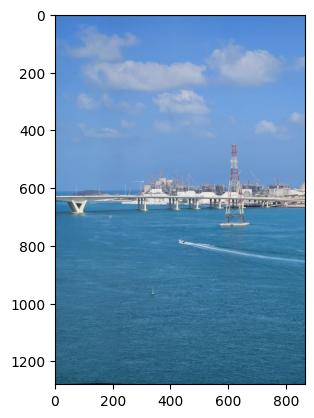

In [43]:
pano = warp_two_images_superpoint_v2(image_list[0], image_list[1])
plt.imshow(pano.astype(np.uint8))

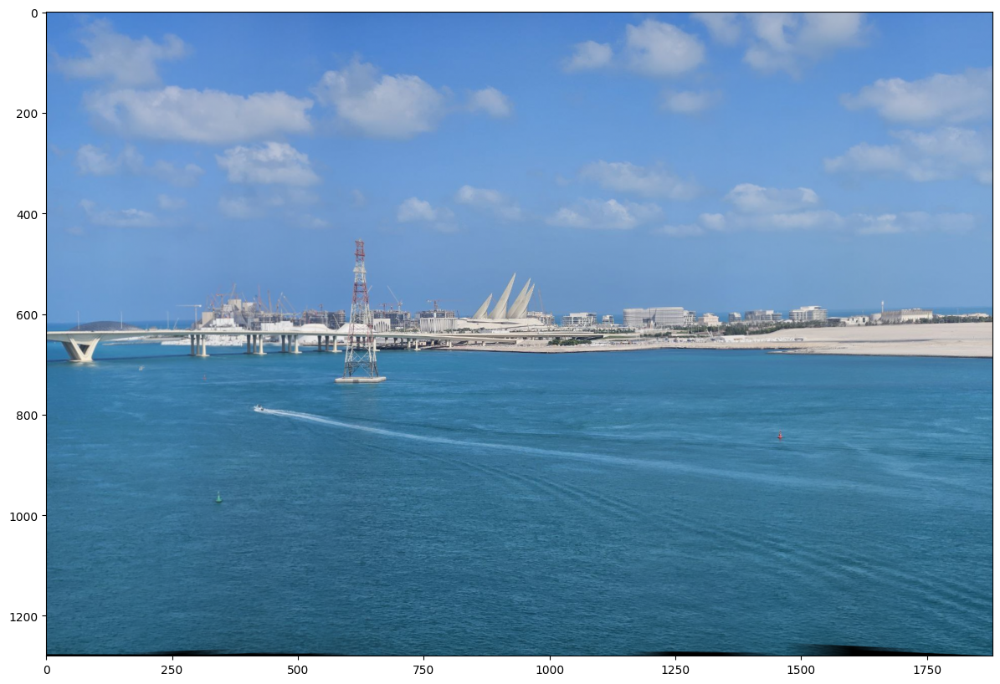

In [45]:
full_panorama = multi_stitching_superpoint_v2(image_list.copy())
full_panorama_normal = np.array(full_panorama, dtype=float)/float(255)
plt.figure(figsize=(15,10))
plt.imshow(full_panorama_normal)
plt.show()